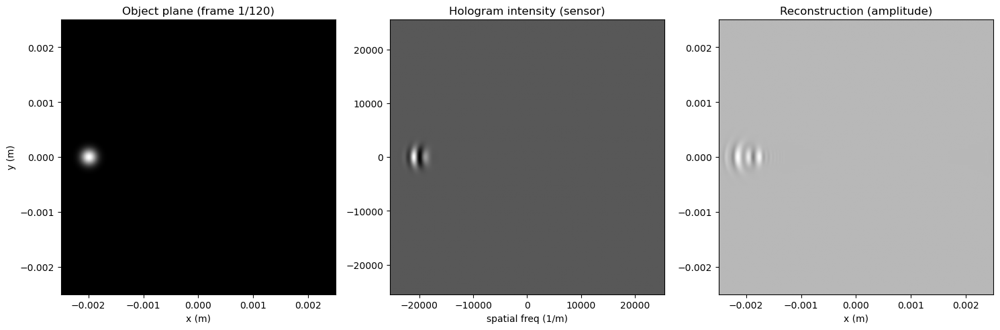

In [3]:
# Single cell: Physics-accurate Fresnel hologram animation with controls (Jupyter)
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from datetime import datetime

# -------------------------
# Config (single source of truth)
# -------------------------
config = {
    "seed": 42,
    "N": 256,                    # grid size (NxN)
    "physical_size": 5e-3,       # physical extent (meters) of the window (sensor/object plane)
    "wavelength": 633e-9,        # meters
    "z": 0.05,                   # propagation distance (m) from object plane to sensor
    "object_type": "gaussian",   # 'point' or 'gaussian' or 'circle'
    "object_amp": 1.0,
    "object_sigma_frac": 0.02,   # gaussian width as fraction of physical_size
    "ref_type": "offaxis",       # 'onaxis' or 'offaxis'
    "ref_tilt_deg": 2.0,         # tilt angle (degrees) for off-axis reference
    "frames": 120,
    "path": "sine",              # 'sine' or 'line' or 'circle'
}

np.random.seed(config["seed"])

# -------------------------
# Helper: grids and Fresnel transfer function
# -------------------------
def grids(N, physical_size):
    x = np.linspace(-physical_size/2, physical_size/2, N)
    y = np.linspace(-physical_size/2, physical_size/2, N)
    X, Y = np.meshgrid(x, y)
    dx = x[1] - x[0]
    return X, Y, dx

def fresnel_transfer(N, dx, wavelength, z):
    # frequency coordinates
    fx = np.fft.fftfreq(N, d=dx)
    fy = np.fft.fftfreq(N, d=dx)
    FX, FY = np.meshgrid(np.fft.fftshift(fx), np.fft.fftshift(fy))
    # Fresnel transfer function (frequency domain)
    H = np.exp(1j * 2 * np.pi / wavelength * z) * np.exp(-1j * np.pi * wavelength * z * (FX**2 + FY**2))
    # use fftshifted H since we'll multiply with fftshifted spectra
    H = np.fft.ifftshift(H)
    return H

def fresnel_propagate(u0, H):
    # propagate: Uout = ifft2( fft2(u0) * H )
    U0 = np.fft.fft2(u0)
    U1 = U0 * H
    u1 = np.fft.ifft2(U1)
    return u1

def fresnel_backpropagate(u_sensor, H):
    # backpropagate by multiplying with conjugate of H
    U = np.fft.fft2(u_sensor)
    Ub = U * np.conj(H)
    ub = np.fft.ifft2(Ub)
    return ub

# -------------------------
# Build coordinate grids and precompute H
# -------------------------
N = config["N"]
X, Y, dx = grids(N, config["physical_size"])
H = fresnel_transfer(N, dx, config["wavelength"], config["z"])
k = 2 * np.pi / config["wavelength"]

# -------------------------
# Reference beam (on-axis or off-axis)
# -------------------------
def reference_field(X, Y, config):
    if config["ref_type"].lower() == "onaxis":
        return np.ones_like(X, dtype=complex) * 1.0
    else:
        # small tilt in x-direction
        theta = np.deg2rad(config["ref_tilt_deg"])
        kx = k * np.sin(theta)
        ky = 0.0
        return np.exp(1j * (kx * X + ky * Y))

# -------------------------
# Object generator (moving)
# -------------------------
def make_object_field(center_x, center_y, config):
    if config["object_type"] == "point":
        # delta-like: put energy in one pixel (approx)
        obj = np.zeros((N, N), dtype=complex)
        # find nearest indices
        ix = int(np.round((center_x + config["physical_size"]/2) / dx))
        iy = int(np.round((center_y + config["physical_size"]/2) / dx))
        ix = np.clip(ix, 0, N-1)
        iy = np.clip(iy, 0, N-1)
        obj[iy, ix] = config["object_amp"]
        return obj
    else:
        # gaussian amplitude
        sigma = config["object_sigma_frac"] * config["physical_size"]
        A = config["object_amp"] * np.exp(-((X-center_x)**2 + (Y-center_y)**2) / (2*sigma**2))
        return A.astype(complex)

# -------------------------
# Path generator (list of centers for frames)
# -------------------------
def generate_path(config):
    frames = config["frames"]
    if config["path"] == "sine":
        t = np.linspace(0, 1, frames)
        # move in x across, y follows sine
        x_centers = (t - 0.5) * config["physical_size"] * 0.8
        y_centers = 0.2 * config["physical_size"] * np.sin(4 * np.pi * t)
    elif config["path"] == "circle":
        t = np.linspace(0, 2*np.pi, frames)
        r = 0.2 * config["physical_size"]
        x_centers = r * np.cos(t)
        y_centers = r * np.sin(t)
    else:  # line
        x_centers = np.linspace(-0.4*config["physical_size"], 0.4*config["physical_size"], frames)
        y_centers = np.zeros(frames)
    return x_centers, y_centers

x_centers, y_centers = generate_path(config)
U_ref_grid = reference_field(X, Y, config)

# -------------------------
# Pre-allocate arrays for visualization scaling
# -------------------------
frames = config["frames"]

# -------------------------
# Matplotlib figure: 3 panels: object, hologram, reconstruction
# -------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
ax_obj, ax_holo, ax_rec = axes
im_obj = ax_obj.imshow(np.zeros((N,N)), cmap='gray', vmin=0, vmax=1,
                       extent=[-config["physical_size"]/2, config["physical_size"]/2,
                               -config["physical_size"]/2, config["physical_size"]/2])
ax_obj.set_title("Object plane (amplitude)")
ax_obj.set_xlabel("x (m)")
ax_obj.set_ylabel("y (m)")

im_holo = ax_holo.imshow(np.zeros((N,N)), cmap='gray', vmin=0, vmax=1,
                         extent=[-1/(2*dx), 1/(2*dx), -1/(2*dx), 1/(2*dx)])
ax_holo.set_title("Hologram intensity (sensor)")
ax_holo.set_xlabel("spatial freq (1/m)")
ax_holo.set_ylabel("")

im_rec = ax_rec.imshow(np.zeros((N,N)), cmap='gray', vmin=0, vmax=1,
                       extent=[-config["physical_size"]/2, config["physical_size"]/2,
                               -config["physical_size"]/2, config["physical_size"]/2])
ax_rec.set_title("Reconstruction (amplitude)")
ax_rec.set_xlabel("x (m)")
ax_rec.set_ylabel("")

plt.tight_layout()

# -------------------------
# Update function: compute physics per frame
# -------------------------
def update(frame_idx):
    cx = x_centers[frame_idx]
    cy = y_centers[frame_idx]
    # object field (amplitude-only or small complex)
    U_obj = make_object_field(cx, cy, config)

    # propagate object to sensor
    U_sensor_obj = fresnel_propagate(U_obj, H)

    # reference at sensor
    U_ref = U_ref_grid

    # hologram intensity: |U_obj_at_sensor + U_ref|^2
    U_total = U_sensor_obj + U_ref
    I_holo = np.abs(U_total)**2
    I_holo = I_holo / (I_holo.max() + 1e-12)

    # simple reconstruction: assume amplitude sqrt(I) with zero phase, then backpropagate
    U_recorded_amp = np.sqrt(I_holo)
    U_rec = fresnel_backpropagate(U_recorded_amp, H)
    A_rec = np.abs(U_rec)
    A_rec = A_rec / (A_rec.max() + 1e-12)

    # object amplitude for display
    A_obj = np.abs(U_obj)
    if A_obj.max() > 0:
        A_obj_disp = A_obj / A_obj.max()
    else:
        A_obj_disp = A_obj

    # update images
    im_obj.set_data(A_obj_disp)
    im_holo.set_data(I_holo)
    im_rec.set_data(A_rec)

    # update titles with frame info
    ax_obj.set_title(f"Object plane (frame {frame_idx+1}/{frames})")
    ax_holo.set_title("Hologram intensity (sensor)")
    ax_rec.set_title("Reconstruction (amplitude)")
    return im_obj, im_holo, im_rec

# Create animation and save
ani = animation.FuncAnimation(fig, update, frames=frames, interval=50, blit=False)
ani.save("wavefront_propagation.gif", writer="pillow", fps=20)

# Display with play/pause controls in Jupyter
HTML(ani.to_jshtml())


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Parameters
wavelength = 632.8e-9  # Red HeNe laser (m)
k = 2 * np.pi / wavelength
z = 0.2                # Propagation distance (m)
N = 256                # Grid size
dx = 10e-6             # Pixel pitch (m)
x = np.linspace(-N//2, N//2-1, N) * dx
X, Y = np.meshgrid(x, x)

# Fresnel propagation function
def fresnel_propagate(U0, z, wavelength, dx):
    N = U0.shape[0]
    fx = np.fft.fftfreq(N, d=dx)
    FX, FY = np.meshgrid(fx, fx)
    H = np.exp(1j * k * z) * np.exp(-1j * np.pi * wavelength * z * (FX**2 + FY**2))
    U1 = np.fft.ifft2(np.fft.fft2(U0) * H)
    return U1

# Initialize object motion path (sine wave)
def object_field(t):
    obj = np.zeros((N, N), dtype=complex)
    # Moving point object
    x_pos = int(N//2 + 40 * np.sin(2 * np.pi * t / 50))
    y_pos = int(N//2 + 40 * np.cos(2 * np.pi * t / 80))
    obj[y_pos, x_pos] = 1.0
    return obj

# Reference wave (plane wave)
ref_wave = np.ones((N, N), dtype=complex)

# Animation update function
def update(frame):
    obj = object_field(frame)

    # Simulate hologram (interference of object and reference waves)
    U_obj = fresnel_propagate(obj, z, wavelength, dx)
    hologram = np.abs(U_obj + ref_wave)**2

    # Reconstruction from hologram
    recon = fresnel_propagate(hologram, -z, wavelength, dx)

    # Update plots
    im_obj.set_array(np.abs(obj)**2)
    im_holo.set_array(hologram)
    im_recon.set_array(np.abs(recon)**2)
    return im_obj, im_holo, im_recon

# Set up figure with 3 panels
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
titles = ["Object Plane", "Hologram", "Reconstruction"]

# First frame initialization
obj0 = object_field(0)
U_obj0 = fresnel_propagate(obj0, z, wavelength, dx)
holo0 = np.abs(U_obj0 + ref_wave)**2
recon0 = fresnel_propagate(holo0, -z, wavelength, dx)

# Display panels
im_obj = axes[0].imshow(np.abs(obj0)**2, cmap='gray', vmin=0, vmax=1)
im_holo = axes[1].imshow(holo0, cmap='gray')
im_recon = axes[2].imshow(np.abs(recon0)**2, cmap='gray')

# Titles & cleanup
for ax, title in zip(axes, titles):
    ax.set_title(title, fontsize=10)
    ax.axis('off')

# Animation
ani = animation.FuncAnimation(fig, update, frames=100, interval=50, blit=True)
ani.save("wavefront_propagation.gif", writer="pillow", fps=20)

plt.tight_layout()
plt.show()


In [ ]:
# Three-panel physics-accurate holography animation (Jupyter-ready)
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# -------- CONFIG --------
config = {
    "seed": 0,
    "N": 256,                    # grid size
    "physical_size": 5e-3,       # meters (object/sensor plane extent)
    "wavelength": 633e-9,        # meters
    "z": 0.05,                   # propagation distance (m)
    "frames": 120,
    "object_type": "gaussian",   # 'point' or 'gaussian'
    "object_amp": 1.0,
    "object_sigma_frac": 0.02,   # gaussian sigma as fraction of physical_size
    "path": "sine",              # 'sine', 'line', 'circle'
    "ref_type": "offaxis",       # 'onaxis' or 'offaxis'
    "ref_tilt_deg": 2.0,         # degrees for off-axis ref
}
np.random.seed(config["seed"])

# -------- HELPERS: GRIDS & FRESNEL --------
N = config["N"]
L = config["physical_size"]
wavelength = config["wavelength"]
z = config["z"]
k = 2 * np.pi / wavelength

x = np.linspace(-L/2, L/2, N)
X, Y = np.meshgrid(x, x)
dx = x[1] - x[0]

def fresnel_transfer(N, dx, wavelength, z):
    fx = np.fft.fftfreq(N, d=dx)
    FY, FX = np.meshgrid(np.fft.fftshift(fx), np.fft.fftshift(fx))
    H = np.exp(1j * k * z) * np.exp(-1j * np.pi * wavelength * z * (FX**2 + FY**2))
    # return unshifted H to multiply with raw fft (we'll use fft2 then ifft2 directly)
    return np.fft.ifftshift(H)

H = fresnel_transfer(N, dx, wavelength, z)

def fresnel_propagate(u0, H):
    U0 = np.fft.fft2(u0)
    U1 = U0 * H
    u1 = np.fft.ifft2(U1)
    return u1

def fresnel_backpropagate(u_sensor, H):
    U = np.fft.fft2(u_sensor)
    Ub = U * np.conj(H)
    ub = np.fft.ifft2(Ub)
    return ub

# -------- REFERENCE FIELD (sensor plane) --------
def reference_field(X, Y, config):
    if config["ref_type"] == "onaxis":
        return np.ones_like(X, dtype=complex)
    else:
        theta = np.deg2rad(config["ref_tilt_deg"])
        kx = k * np.sin(theta)
        ky = 0.0
        return np.exp(1j * (kx * X + ky * Y))

U_ref_sensor = reference_field(X, Y, config)

# -------- OBJECT GENERATOR & PATH --------
def make_object_field(center_x, center_y, config):
    if config["object_type"] == "point":
        obj = np.zeros((N, N), dtype=complex)
        ix = int(np.round((center_x + L/2) / dx))
        iy = int(np.round((center_y + L/2) / dx))
        ix = np.clip(ix, 0, N-1); iy = np.clip(iy, 0, N-1)
        obj[iy, ix] = config["object_amp"]
        return obj
    else:
        sigma = config["object_sigma_frac"] * L
        A = config["object_amp"] * np.exp(-((X-center_x)**2 + (Y-center_y)**2) / (2*sigma**2))
        return A.astype(complex)

def generate_path(config):
    frames = config["frames"]
    if config["path"] == "sine":
        t = np.linspace(0, 1, frames)
        x_centers = (t - 0.5) * L * 0.8
        y_centers = 0.2 * L * np.sin(4 * np.pi * t)
    elif config["path"] == "circle":
        t = np.linspace(0, 2*np.pi, frames)
        r = 0.25 * L
        x_centers = r * np.cos(t)
        y_centers = r * np.sin(t)
    else:
        x_centers = np.linspace(-0.4*L, 0.4*L, frames)
        y_centers = np.zeros(frames)
    return x_centers, y_centers

x_centers, y_centers = generate_path(config)

# -------- VISUAL SETUP (three panels) --------
fig, axes = plt.subplots(1, 3, figsize=(14, 5))
ax_obj, ax_holo, ax_rec = axes

# Precompute an initial frame to set fixed color scales
# Create a sample object and hologram to establish ranges
U_obj0 = make_object_field(x_centers[0], y_centers[0], config)
U_s0 = fresnel_propagate(U_obj0, H)
U_ref = U_ref_sensor
I_h0 = np.abs(U_s0 + U_ref)**2
recon0 = fresnel_backpropagate(np.sqrt(I_h0) * np.exp(1j*np.angle(U_ref)), H)

# Define vmin/vmax to avoid flicker
obj_vmin, obj_vmax = 0.0, np.max(np.abs(U_obj0)**2) if np.max(np.abs(U_obj0))>0 else 1.0
holo_vmin, holo_vmax = 0.0, np.max(I_h0)
rec_vmin, rec_vmax = 0.0, np.max(np.abs(recon0)**2)

# Image artists
im_obj = ax_obj.imshow(np.abs(U_obj0)**2, cmap='gray', vmin=obj_vmin, vmax=obj_vmax, origin='lower')
im_holo = ax_holo.imshow(I_h0, cmap='inferno', vmin=holo_vmin, vmax=holo_vmax, origin='lower')
im_rec = ax_rec.imshow(np.abs(recon0)**2, cmap='gray', vmin=rec_vmin, vmax=rec_vmax, origin='lower')

# Titles & style
ax_obj.set_title("Object plane (intensity)")
ax_holo.set_title("Hologram (intensity)")
ax_rec.set_title("Reconstruction (intensity)")
for ax in axes:
    ax.axis('off')

plt.tight_layout()

# -------- UPDATE FUNCTION (per-frame physics) --------
frames = config["frames"]
def update(frame_idx):
    cx = x_centers[frame_idx]
    cy = y_centers[frame_idx]
    U_obj = make_object_field(cx, cy, config)

    # Propagate object to sensor plane
    U_sensor_obj = fresnel_propagate(U_obj, H)

    # Interfere with reference at sensor
    U_total = U_sensor_obj + U_ref
    I_holo = np.abs(U_total)**2
    # normalize by precomputed max to keep consistent display
    if holo_vmax > 0:
        I_disp = I_holo / holo_vmax
    else:
        I_disp = I_holo

    # Reconstruct: illuminate amplitude sqrt(I) with reference phase, then backpropagate
    recorded_field = np.sqrt(I_holo) * np.exp(1j * np.angle(U_ref))
    U_rec = fresnel_backpropagate(recorded_field, H)
    rec_int = np.abs(U_rec)**2
    if rec_vmax > 0:
        rec_disp = rec_int / rec_vmax
    else:
        rec_disp = rec_int

    # Object display intensity
    obj_int = np.abs(U_obj)**2
    if obj_vmax > 0:
        obj_disp = obj_int / obj_vmax
    else:
        obj_disp = obj_int

    # Update images
    im_obj.set_data(obj_disp)
    im_holo.set_data(I_disp)
    im_rec.set_data(rec_disp)

    # update frame title optionally
    ax_obj.set_title(f"Object (frame {frame_idx+1}/{frames})")
    return im_obj, im_holo, im_rec

# -------- ANIMATE and RETURN HTML CONTROLS --------
ani = animation.FuncAnimation(fig, update, frames=frames, interval=50, blit=False)
ani.save("wavefront_propagation.gif", writer="pillow", fps=20)
HTML(ani.to_jshtml())


In [ ]:
# Advanced: physics-accurate Fresnel + realistic noise models (Gaussian, Poisson, Speckle)
# Jupyter-ready animation (Object | Hologram | Reconstruction)
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# -------- CONFIG (modify these)
config = {
    "seed": 0,
    "N": 256,                    # grid size
    "physical_size": 5e-3,       # meters (object/sensor plane extent)
    "wavelength": 633e-9,        # meters
    "z": 0.05,                   # propagation distance (m)
    "frames": 120,
    "object_type": "gaussian",   # 'point' or 'gaussian'
    "object_amp": 1.0,
    "object_sigma_frac": 0.02,   # gaussian sigma fraction of physical_size
    "path": "sine",              # 'sine','line','circle'
    "ref_type": "offaxis",       # 'onaxis' or 'offaxis'
    "ref_tilt_deg": 2.0,         # degrees for off-axis reference
    # Noise section
    "noise_type": "speckle",     # 'none', 'gaussian', 'poisson', 'speckle', or combinations like 'gaussian+poisson'
    "gaussian_sigma": 0.01,      # additive Gaussian noise (fraction of max intensity)
    "poisson_photons": 1e5,      # mean photons at hologram max (larger -> less relative shot noise)
    "speckle_strength": 0.6,     # 0..1 controls speckle modulation depth
}
np.random.seed(config["seed"])

# -------- GRID + PHYSICALS
N = config["N"]
L = config["physical_size"]
wavelength = config["wavelength"]
z = config["z"]
k = 2 * np.pi / wavelength

x = np.linspace(-L/2, L/2, N)
X, Y = np.meshgrid(x, x)
dx = x[1] - x[0]

# -------- Fresnel transfer function (Fourier method)
def fresnel_transfer(N, dx, wavelength, z):
    fx = np.fft.fftfreq(N, d=dx)
    FY, FX = np.meshgrid(np.fft.fftshift(fx), np.fft.fftshift(fx))
    H = np.exp(1j * k * z) * np.exp(-1j * np.pi * wavelength * z * (FX**2 + FY**2))
    return np.fft.ifftshift(H)  # unshift for multiplying raw FFT

H = fresnel_transfer(N, dx, wavelength, z)

def fresnel_propagate(u0, H):
    U0 = np.fft.fft2(u0)
    U1 = U0 * H
    u1 = np.fft.ifft2(U1)
    return u1

def fresnel_backpropagate(u_sensor, H):
    U = np.fft.fft2(u_sensor)
    Ub = U * np.conj(H)
    ub = np.fft.ifft2(Ub)
    return ub

# -------- Reference field (sensor plane)
def reference_field(X, Y, config):
    if config["ref_type"] == "onaxis":
        return np.ones_like(X, dtype=complex)
    else:
        theta = np.deg2rad(config["ref_tilt_deg"])
        kx = k * np.sin(theta)
        ky = 0.0
        return np.exp(1j * (kx * X + ky * Y))

U_ref_sensor = reference_field(X, Y, config)

# -------- Object generator & motion path
def make_object_field(center_x, center_y, config):
    if config["object_type"] == "point":
        obj = np.zeros((N, N), dtype=complex)
        ix = int(np.round((center_x + L/2) / dx))
        iy = int(np.round((center_y + L/2) / dx))
        ix = np.clip(ix, 0, N-1); iy = np.clip(iy, 0, N-1)
        obj[iy, ix] = config["object_amp"]
        return obj
    else:
        sigma = config["object_sigma_frac"] * L
        A = config["object_amp"] * np.exp(-((X-center_x)**2 + (Y-center_y)**2) / (2*sigma**2))
        return A.astype(complex)

def generate_path(config):
    frames = config["frames"]
    if config["path"] == "sine":
        t = np.linspace(0, 1, frames)
        x_centers = (t - 0.5) * L * 0.8
        y_centers = 0.2 * L * np.sin(4 * np.pi * t)
    elif config["path"] == "circle":
        t = np.linspace(0, 2*np.pi, frames)
        r = 0.25 * L
        x_centers = r * np.cos(t)
        y_centers = r * np.sin(t)
    else:
        x_centers = np.linspace(-0.4*L, 0.4*L, frames)
        y_centers = np.zeros(frames)
    return x_centers, y_centers

x_centers, y_centers = generate_path(config)

# -------- Noise model helpers
def add_gaussian_noise(I, sigma_frac):
    sigma = sigma_frac * np.max(I)
    return I + np.random.normal(scale=sigma, size=I.shape)

def add_poisson_noise(I, photons_max):
    # scale I to [0, photons_max], apply Poisson, rescale back
    I = np.clip(I, 0, None)
    scaled = I / (I.max() + 1e-12) * photons_max
    noisy = np.random.poisson(scaled).astype(float)
    # return to original scaling
    return noisy / (photons_max + 1e-12) * (I.max() + 1e-12)

def add_speckle(U_sensor, strength):
    # multiplicative speckle: generate random phase screen and multiply at sensor
    phi = np.random.uniform(0, 2*np.pi, size=U_sensor.shape)
    speckle_field = np.exp(1j * phi)
    # mix the speckle field with sensor field: U' = (1-s)*U + s*U*speckle
    return (1 - strength) * U_sensor + strength * U_sensor * speckle_field

# -------- Prepare figure and fixed scales
fig, axes = plt.subplots(1, 3, figsize=(14, 5))
ax_obj, ax_holo, ax_rec = axes

# initial frame to set vmin/vmax
U_obj0 = make_object_field(x_centers[0], y_centers[0], config)
U_s0 = fresnel_propagate(U_obj0, H)
I_h0 = np.abs(U_s0 + U_ref_sensor)**2
U_rec0 = fresnel_backpropagate(np.sqrt(I_h0) * np.exp(1j*np.angle(U_ref_sensor)), H)

obj_vmin, obj_vmax = 0.0, np.max(np.abs(U_obj0)**2) if np.max(np.abs(U_obj0))>0 else 1.0
holo_vmin, holo_vmax = 0.0, np.max(I_h0)
rec_vmin, rec_vmax = 0.0, np.max(np.abs(U_rec0)**2)

im_obj = ax_obj.imshow(np.abs(U_obj0)**2, cmap='gray', vmin=obj_vmin, vmax=obj_vmax, origin='lower')
im_holo = ax_holo.imshow(I_h0, cmap='inferno', vmin=holo_vmin, vmax=holo_vmax, origin='lower')
im_rec = ax_rec.imshow(np.abs(U_rec0)**2, cmap='gray', vmin=rec_vmin, vmax=rec_vmax, origin='lower')

ax_obj.set_title("Object (intensity)")
ax_holo.set_title("Hologram (intensity)")
ax_rec.set_title("Reconstruction (intensity)")
for ax in axes:
    ax.axis('off')
plt.tight_layout()

# -------- Update per frame (including noise)
frames = config["frames"]
def update(frame_idx):
    cx = x_centers[frame_idx]
    cy = y_centers[frame_idx]
    U_obj = make_object_field(cx, cy, config)

    # propagate object to sensor
    U_sensor_obj = fresnel_propagate(U_obj, H)

    # optionally add speckle (multiplicative)
    U_sensor_obj_noisy = U_sensor_obj
    if "speckle" in config["noise_type"]:
        U_sensor_obj_noisy = add_speckle(U_sensor_obj_noisy, config["speckle_strength"])

    # interference with reference
    U_total = U_sensor_obj_noisy + U_ref_sensor
    I_holo = np.abs(U_total)**2

    # additive gaussian noise
    if "gaussian" in config["noise_type"]:
        I_holo = add_gaussian_noise(I_holo, config["gaussian_sigma"])

    # Poisson (shot) noise
    if "poisson" in config["noise_type"]:
        I_holo = add_poisson_noise(I_holo, config["poisson_photons"])

    # normalize displays by precomputed maxima (for stable visualization)
    I_disp = I_holo / (holo_vmax + 1e-12)
    # reconstruct: illuminate sqrt(I) with reference phase and backpropagate
    recorded_field = np.sqrt(np.clip(I_holo,0,None)) * np.exp(1j * np.angle(U_ref_sensor))
    U_rec = fresnel_backpropagate(recorded_field, H)
    rec_int = np.abs(U_rec)**2
    rec_disp = rec_int / (rec_vmax + 1e-12) if rec_vmax>0 else rec_int

    obj_int = np.abs(U_obj)**2
    obj_disp = obj_int / (obj_vmax + 1e-12) if obj_vmax>0 else obj_int

    im_obj.set_data(obj_disp)
    im_holo.set_data(I_disp)
    im_rec.set_data(rec_disp)

    ax_obj.set_title(f"Object (frame {frame_idx+1}/{frames})")
    return im_obj, im_holo, im_rec

ani = animation.FuncAnimation(fig, update, frames=frames, interval=50, blit=False)
ani.save("wavefront_propagation.gif", writer="pillow", fps=20)

# Show with interactive controls (Jupyter)
HTML(ani.to_jshtml())
